# Object Detection - Demo


## Intro

For this demo, we'll use facebook/detr-resnet-50: 
- https://huggingface.co/facebook/detr-resnet-50

<br>


**Architecture**:
- This model uses a specific implementation of the transformer architecture for object detection, called the DETR architecture.

- DETR (DEtection TRansformer) architecture combines a Convolutional Neural Network for local feature extraction + Transformers for object detection.

- more info: https://blog.roboflow.com/what-is-detr/

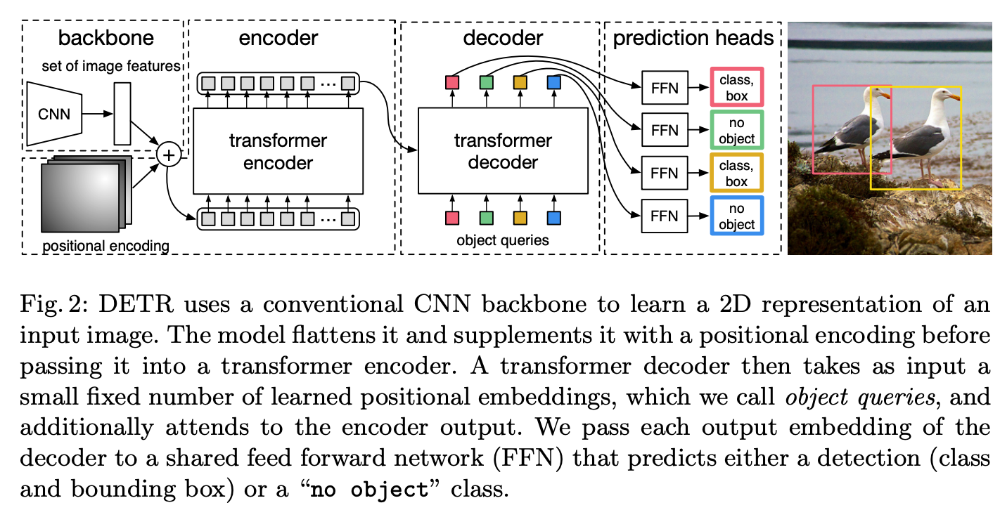

<br>


**How DETR works**:

- The model uses a CNN backbone (e.g. ResNet-50) to extract low-level image features (e.g., edges, textures, object parts).

- These features are then passed to a Transformer encoder-decoder architecture that processes the image globally:

    - The Encoder uses self-attention to understand the image as a whole and the relationships between all the different parts of the image.

    - The Decoder uses this contextual information, along with a set of object queries (empty slots), to predict possible objects.

    - Note: unlike traditional object detectors that use region proposals, DETR's Transformer encoder takes the entire set of features from the CNN and processes them globally, allowing for a more holistic understanding of the image (e.g., surrounding scene elements help identify ambiguous objects).

- Finally, the data goes through a small Feed-Forward Network (FFN) to predict class labels and bounding boxes for the objects detected.

<br>


**Training data**:
- The model is trained on COCO dataset, a large-scale dataset widely used in computer vision (~118k training images)

- It includes 80 common object categories such as:
  - person
  - bicycle
  - car
  - motorcycle
  - ...
  - full list: https://github.com/facebookresearch/detectron2/blob/main/detectron2/data/datasets/builtin_meta.py#L20-L87

<br>


**Some interesting notebooks**:

- Hands-on tutorial for DETR:
    - https://colab.research.google.com/github/facebookresearch/detr/blob/colab/notebooks/detr_attention.ipynb#scrollTo=_GQzINI-FBWp)

- Object Detection with DETR - a minimal implementation:
    - https://colab.research.google.com/github/facebookresearch/detr/blob/colab/notebooks/detr_demo.ipynb)

- Panoptic segmentation using DETR:
    - https://colab.research.google.com/github/facebookresearch/detr/blob/colab/notebooks/DETR_panoptic.ipynb#scrollTo=fzkJUMTxn8hB)


<br>

## Initial setup

In [1]:
# !pip install torch
# !pip install transformers
# !pip install pillow
# !pip install requests

In [2]:
import torch
from transformers import DetrImageProcessor, DetrForObjectDetection
from PIL import Image, ImageDraw, ImageFont
import requests

In [3]:
# 
# Helper functions to load images
# 

def load_image_from_file(image_path):
    return Image.open(image_path).convert("RGB")

def load_image_from_url(url):
    image = Image.open(requests.get(url, stream=True).raw).convert("RGB")
    return image

In [4]:
#
# Let's also define some sample images
#

sample_images = {
    "street_1": "https://drive.google.com/uc?export=download&id=1k4SYuhOKFbJ-EO38sFFT6_Iydzq0HCwW",

    "street_2": "https://drive.google.com/uc?export=download&id=1g5aF1OSoBablg6mwHTEUBd1zrSx7iAGT",

    "street_3": "https://drive.google.com/uc?export=download&id=1QlvboGpY5wefadSzsMgY8aVN-kq2JnVy",

    "road_1": "https://drive.google.com/uc?export=download&id=1wk7JuPZWd1ueVmfHB_B68Qn2W9B9FKqP",

    "misc_1": "https://drive.google.com/uc?export=download&id=1Q_xc7Sq5XOcS16rw2FpyJX8Mv9tImGMY",

    "misc_2": "https://drive.google.com/uc?export=download&id=1iorXUtFARlRv1k5t1pOdYYZCgI9PvOsc",
}


In [5]:
# 
# Ignore PyTorch warnings
# 
# We'll ignore warnings from the module "torch.nn.modules.module"
# (appear when loading a pretrained model due to how it handles placeholder tensors internally).

import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="torch.nn.modules.module")

<br>

## Load processor & model


In [6]:
# 
# Load processor & model
# 

processor = DetrImageProcessor.from_pretrained(
    "facebook/detr-resnet-50"
)

model = DetrForObjectDetection.from_pretrained(
    "facebook/detr-resnet-50",
).to(torch.device("cpu")) # note: for this example, we use CPU.


Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [7]:
#
# Function to get predictions from the model
#

def get_predictions(image, processor, model, threshold=0.9):
    # Preprocess the image (resizes, normalizes, and converts it to a PyTorch tensor).
    preprocessed_image = processor(images=image, return_tensors="pt")

    # Run the image through the DETR model
    # (since we are doing inference and not training, we can run without gradient tracking for better performance).
    with torch.no_grad():
        outputs = model(**preprocessed_image) # outputs contains raw model predictions: logits for class labels and bounding box coordinates.

    # Convert original image size (width, height) to (height, width) tensor as expected by the processor
    target_sizes = torch.tensor([image.size[::-1]])

    # Post-process model outputs: scale boxes to original image size and filter by confidence threshold
    results = processor.post_process_object_detection(
        outputs, # the raw model outputs
        target_sizes=target_sizes, # convert to original image size
        threshold=threshold # filter out low-confidence predictions
    )[0] # we only have one image, so we take the first result

    return results


In [8]:
# 
# Let's load an image and get predictions
# 

img_1 = load_image_from_url(sample_images["street_1"])
results_1 = get_predictions(img_1, processor, model)


# the model returns a dictionary with three keys:
# - scores: confidence of each detected object;
# - labels: predicted class IDs;
# - boxes: bounding box coordinates [x_min, y_min, x_max, y_max]
display(results_1)

{'scores': tensor([0.9852, 0.9864, 0.9983, 0.9990]),
 'labels': tensor([3, 3, 3, 3]),
 'boxes': tensor([[4.6455e-01, 2.4939e-01, 1.5437e+02, 5.2167e+01],
         [9.8498e+02, 4.0569e+02, 1.0239e+03, 5.4715e+02],
         [1.8882e+01, 6.9272e+01, 4.2149e+02, 3.4556e+02],
         [5.8707e+02, 1.7301e+02, 1.0067e+03, 4.6479e+02]])}

In [9]:
#
# Function to draw detected objects
#

def draw_detected_objects(image, results, model, objects_to_render=None, highlight_color="orange", outline_width=5):

    """
    Draws bounding boxes and labels on detected objects in an image.

    Parameters:
    - image: The input image on which to draw.
    - results (dict): Detection results from the model (facebook/detr-resnet-50)
    - model: Object detection model
    - objects_to_render (list, optional): List of class names to highlight. Example: ["bicycle", "handbag"].
    - highlight_color (str, optional): Color used for highlighted objects.
    - outline_width (int, optional): Width of the bounding box outline for highlighted objects.
    """

    image_copy = image.copy()
    draw = ImageDraw.Draw(image_copy)

    # Iterate over detected objects and draw bounding boxes and labels
    for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
        class_name = model.config.id2label[label.item()]
        
        # If the class is not in the objects_to_render list, use a different color and width
        if objects_to_render and class_name not in objects_to_render:
            color = "white"
            width = 1
            label_size = 1
        else:
            color = highlight_color
            width = outline_width
            label_size = 20
                
        # Draw the bounding box
        box = [round(i, 2) for i in box.tolist()]
        draw.rectangle(box, outline=color, width=width)

        # Draw the label and score
        text = f"{class_name}: {score:.2f}"
        text_position = (box[0] + 10, box[1] + 10)
        draw.text(text_position, text, fill=color, font=ImageFont.load_default().font_variant(size=label_size))

    # Display the original image and the image with detected objects
    display(image)
    display(image_copy)


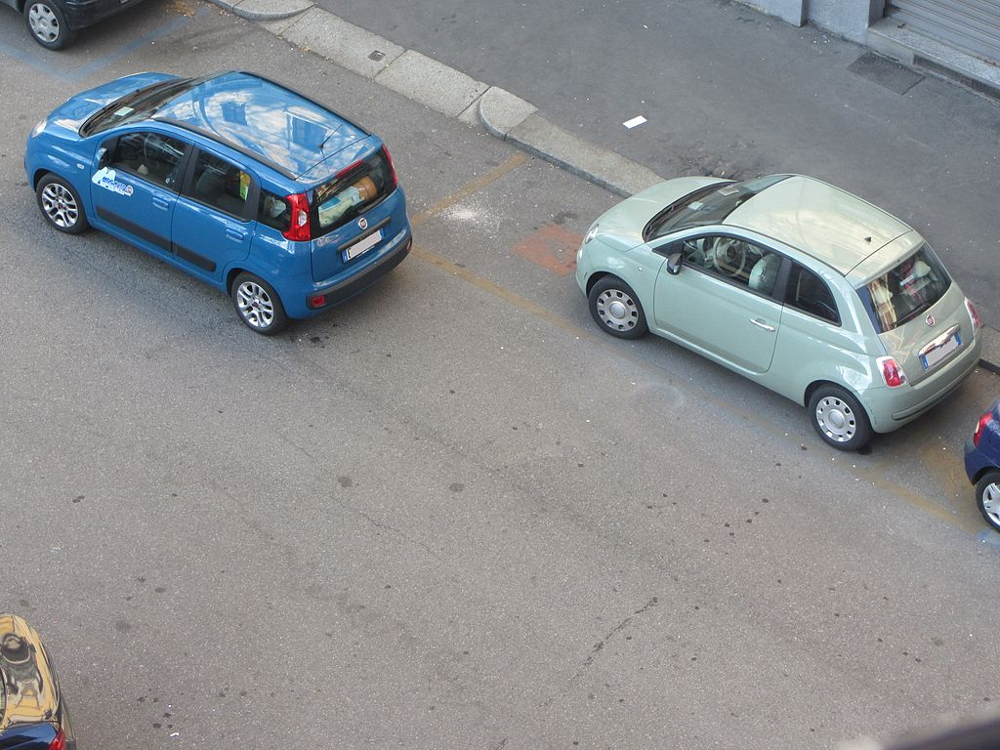

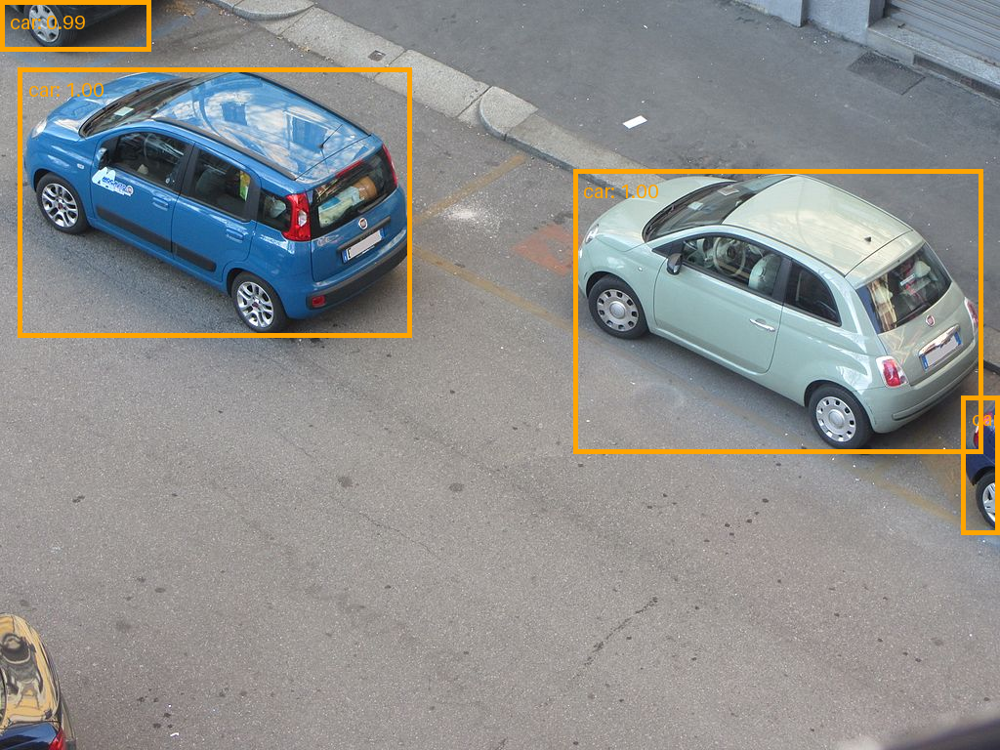

In [10]:
img_1 = load_image_from_url(sample_images["street_1"])
results_1 = get_predictions(img_1, processor, model)
draw_detected_objects(img_1, results_1, model)

<br>

## Detecting multiple objects



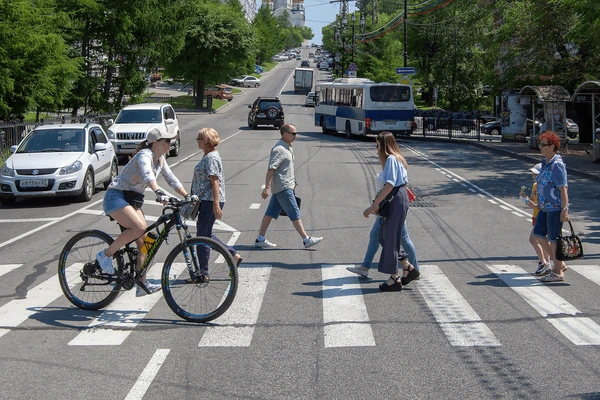

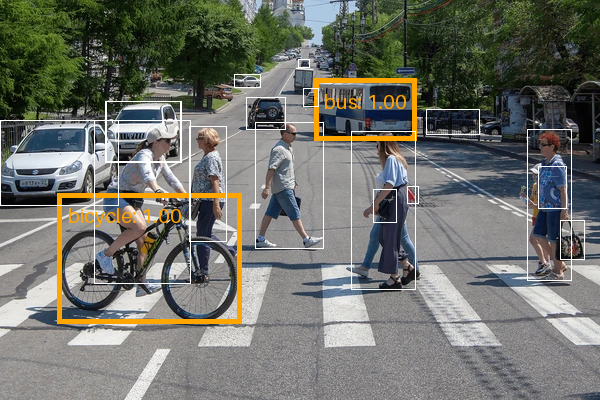

In [11]:
img_2 = load_image_from_url(sample_images["street_2"])
results_2 = get_predictions(img_2, processor, model)
draw_detected_objects(img_2, results_2, model, objects_to_render=["bus", "bicycle"])

<br>

## It's not perfect...

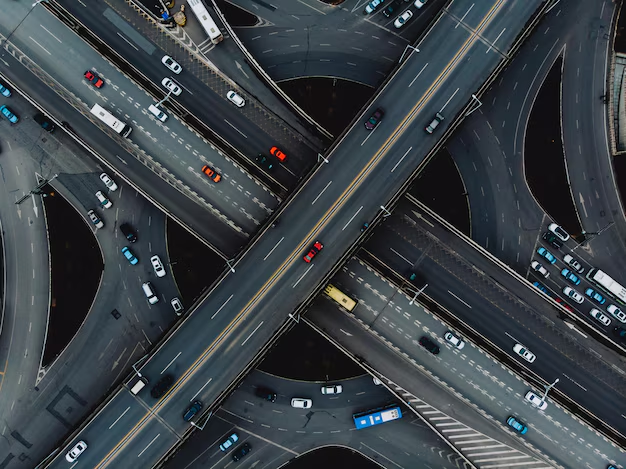

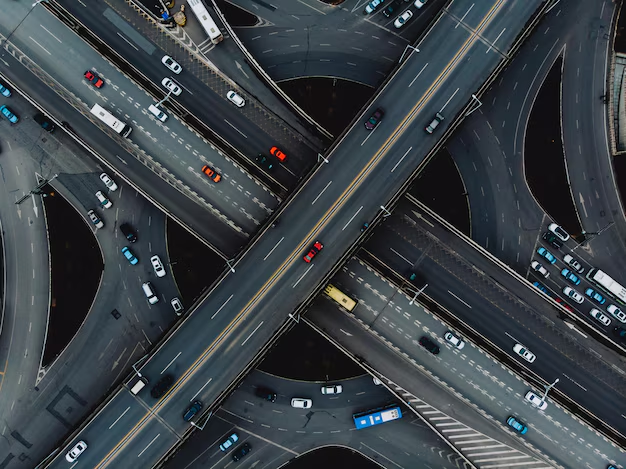

In [12]:
img_4 = load_image_from_url(sample_images["road_1"])
results_4 = get_predictions(img_4, processor, model)
draw_detected_objects(img_4, results_4, model, objects_to_render=["car"])

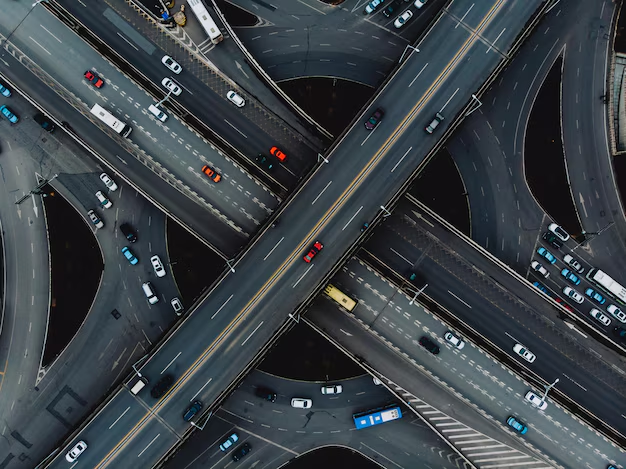

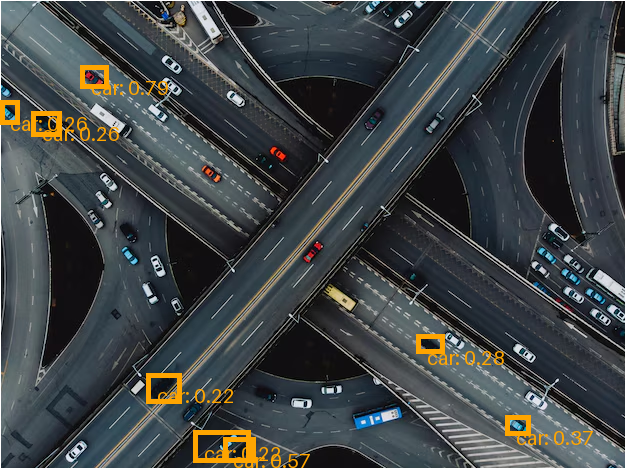

In [13]:
# 
# Let's try with a lower threshold...
# 


img_4 = load_image_from_url(sample_images["road_1"])
results_4 = get_predictions(img_4, processor, model, threshold=0.2)  # Using a lower threshold for more detections
draw_detected_objects(img_4, results_4, model, objects_to_render=["car"])